In [2]:
import scipy.io as sio
import numpy as np
import pandas as pd
from sklearn.utils import shuffle

In [3]:
import anndata as ad

/Users/joeyta/anaconda3/lib/python3.6/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [4]:
data = sio.loadmat("GSE110823_RAW/GSM3017261_150000_CNS_nuclei.mat")

In [5]:
DGE = data["DGE"]

In [6]:
#Genes
genes = pd.Series(data['genes']).str.strip(' ').values

#Sample types
sample_type = pd.Series(data['sample_type']).str.strip(' ').values

#Main cluster assignment
cluster_assignment = pd.Series(data['cluster_assignment']).str.strip(' ').values

#Spinal cluster assignment
spinal_cluster_assignment = pd.Series(data['spinal_cluster_assignment']).str.strip(' ').values

In [7]:
obs = pd.DataFrame({"sample":sample_type, "cluster": cluster_assignment, "spinal_cluster":spinal_cluster_assignment}, dtype = str)

In [8]:
var = pd.DataFrame(index = genes)

In [9]:
obs

,sample,cluster,spinal_cluster
0,p2_brain,53 Unresolved,NA
1,p11_brain,44 Migrating Int Lhx6,NA
2,p11_brain,53 Unresolved,NA
3,p2_brain,44 Migrating Int Lhx6,NA
4,p2_brain,53 Unresolved,NA
...,...,...,...
156044,p2_brain,35 HIPP Pyr Crym,NA
156045,p2_brain,17 CTX PyrL6,NA
156046,p2_brain,53 Unresolved,NA
156047,p2_brain,39 HIPP Granule Nrp2,NA


In [10]:
adata = ad.AnnData(DGE)

In [11]:
adata.obs["sample_name"] = sample_type

In [12]:
adata.obs["cluster"] = cluster_assignment
adata.obs["spinal_cluster"] = spinal_cluster_assignment
adata.var["gene_name"] = genes

In [13]:
# Parameter settings we use throughout the notebook

num_TSNE = 2
state = 42
metric = "euclidean"
n_neighbors = 30
num_PCA = 50
num_NCA = 10

# Filtering criteria
cell_threshold = 100
gene_threshold = 2

mito_criteria = 5

n_top_genes = 2000

n_bins = 20

flavor="seurat"

In [14]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as mpatches
import scanpy as sc
from scipy import stats

from collections import OrderedDict
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from sklearn.preprocessing import scale
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import NeighborhoodComponentsAnalysis
from matplotlib import cm
from matplotlib.lines import Line2D

def nd(arr):
    return np.asarray(arr).reshape(-1)
def yex(ax):
    lims = [np.min([ax.get_xlim(), ax.get_ylim()]),
            np.max([ax.get_xlim(), ax.get_ylim()])]

    # now plot both limits against eachother
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    ax.set_aspect('equal')
    ax.set_xlim(lims)
    ax.set_ylim(lims)
    return ax

def trim_axs(axs, N):
    """little helper to massage the axs list to have correct length..."""
    axs = axs.flat
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]

import warnings
warnings.filterwarnings('ignore')

fsize=20

plt.rcParams.update({'font.size': fsize})
%config InlineBackend.figure_format = 'retina'

In [15]:
adata.obs["cell_counts"] = adata.X.sum(axis=1)
adata.var["gene_counts"] = nd(adata.X.sum(axis=0))

adata.obs["n_genes"] = nd((adata.X>0).sum(axis=1))
adata.var["n_cells"] = nd((adata.X>0).sum(axis=0))

mito_genes = adata.var_names.str.startswith('mt-')
adata.obs["percent_mito"] = adata[:,mito_genes].X.sum(axis=1)/adata.X.sum(axis=1)*100

In [16]:
adata.obs["pass_count_filter"] = adata.obs["cell_counts"] > cell_threshold
adata.obs["pass_mito_filter"] = adata.obs.percent_mito < mito_criteria
adata.var["pass_gene_filter"] = adata.var["n_cells"] > gene_threshold

In [17]:
pseudotime_labels = ['55 Oligo MFOL2', '56 Oligo MFOL1', '57 Oligo MOL', '58 Oligo NFOL1',
       '59 Oligo COP1', '60 Oligo COP2','61 OPC']

In [18]:
adata.obs["pseudotime_analysis"] = np.isin(adata.obs["cluster"].values, pseudotime_labels)

In [19]:
np.sum(adata.obs["pseudotime_analysis"].values)

10087

In [20]:
cell_mask = adata.obs["pseudotime_analysis"].values #np.logical_and(adata.obs["pass_count_filter"].values, adata.obs["pass_mito_filter"].values, adata.obs["pseudotime_analysis"].values)
gene_mask = adata.var["pass_gene_filter"].values

In [21]:
print("Current Shape: {:,} cells x {:,} genes".format(adata.shape[0], adata.shape[1]))
print("    New shape: {:,} cells x {:,} genes".format(cell_mask.sum(), gene_mask.sum()))

Current Shape: 156,049 cells x 26,894 genes
    New shape: 10,087 cells x 23,734 genes


In [22]:
data = adata[cell_mask, gene_mask]

In [23]:
data.layers["raw"] = data.X

In [24]:
scale_num = 1000000
data.layers["norm"] = normalize(data.X, norm="l1", axis=1)*scale_num

In [25]:
data.layers["log1p"] = np.log1p(data.layers["norm"])
data.uns = OrderedDict([("log1p", {"base":None})])

In [26]:
data.X = data.layers["log1p"]

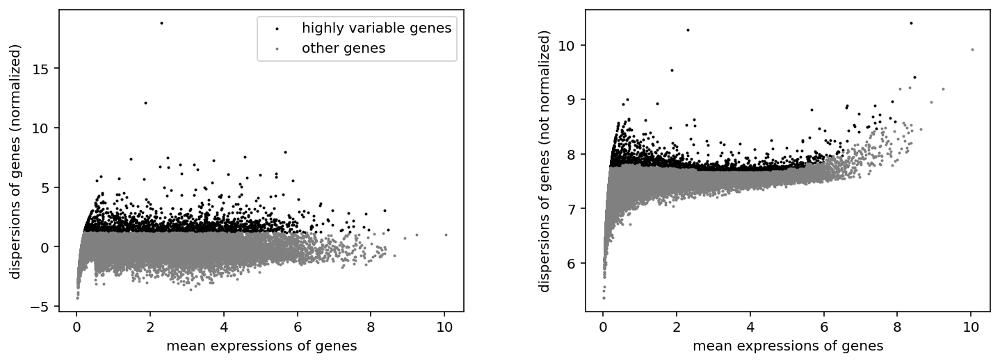

In [27]:
sc.pp.highly_variable_genes(data, n_top_genes=n_top_genes, flavor=flavor, n_bins=n_bins)
hvg_mask = data.var.highly_variable.values
sc.pl.highly_variable_genes(data)

In [28]:
%%time
# Scaling operation cannot be performed on the sparse matrix, so we make a dense matrix
mat = data.layers["log1p"].toarray()
data.layers["scale"] = scale(mat, axis=0, with_mean=True, with_std=True, copy=True)
data.X = data.layers["scale"]

del mat

CPU times: user 7.49 s, sys: 4.16 s, total: 11.7 s
Wall time: 11.7 s


In [29]:
hvg_data = data[:, hvg_mask]

In [30]:
# PCA
X = hvg_data.X

tsvd = TruncatedSVD(n_components=num_PCA)
hvg_data.obsm["X_pca"] = tsvd.fit_transform(X)

In [31]:
#PCA to 10D
X = hvg_data.X
tsvd = TruncatedSVD(n_components = 10)
hvg_data.obsm["X_pca_10D"] = tsvd.fit_transform(X)

In [32]:
#TSNE 
X = hvg_data.obsm["X_pca_10D"]
tsne = TSNE(n_components = num_TSNE, metric = metric, random_state=state)
hvg_data.obsm["X_pca_tsne"] = tsne.fit_transform(X)

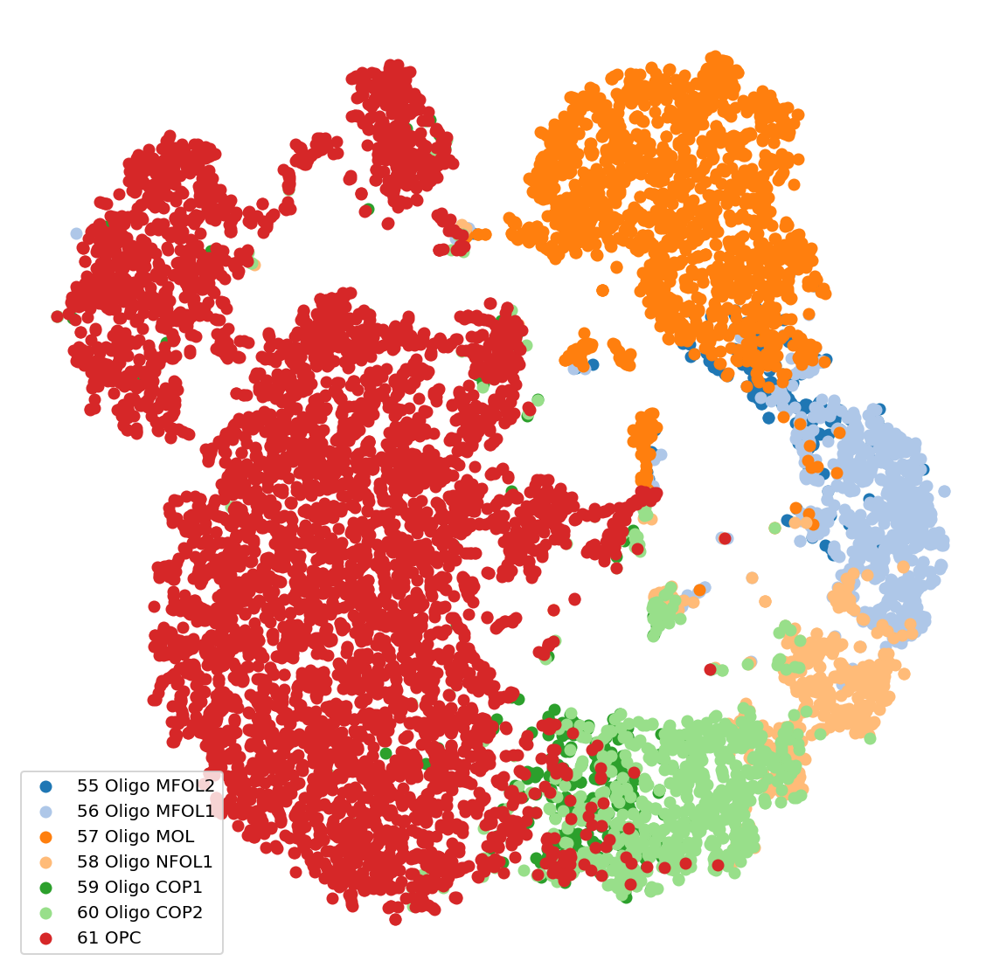

In [33]:
fig, ax = plt.subplots(figsize = (10, 10))
clusters = np.unique(hvg_data.obs.cluster)
cmap = cm.get_cmap("tab20")
for i, c in enumerate(clusters):
    XX = hvg_data[hvg_data.obs.cluster==c, :].obsm["X_pca_tsne"]
    x = XX[:, 0]
    y = XX[:, 1]
    ax.scatter(x, y, label = c, color = cmap(i))
ax.set_axis_off()
ax.legend()

In [71]:
# NCA
X = hvg_data.obsm["X_pca"]
y = hvg_data.obs["cluster"].values
nca = NeighborhoodComponentsAnalysis(n_components = num_NCA, random_state = state)
hvg_data.obsm["X_nca"] = nca.fit_transform(X, y)

In [72]:
# t-SNE the NCA projection
X = hvg_data.obsm["X_nca"]
tsne = TSNE(n_components=num_TSNE, metric=metric, random_state=state)
hvg_data.obsm["X_nca_tsne"] = tsne.fit_transform(X)

In [36]:
copy = hvg_data.copy()

In [35]:
hvg_data.obs["nca_label"] = hvg_data.obs["cluster"]
#copy.obs["nca_label"] = hvg_data.obs["sample_name"]
#double = hvg_data.concatenate(copy, join = "outer")

In [121]:
labels = hvg_data.obs.cluster.values
labels = shuffle(labels, random_state = 0)
hvg_data.obs["shuffled_label"] = labels

In [39]:
X = hvg_data.obsm["X_pca"]
y = hvg_data.obs["shuffled_label"].values
nca = NeighborhoodComponentsAnalysis(n_components = num_NCA, random_state = state)
hvg_data.obsm["X_nca_shuffled"] = nca.fit_transform(X, y)

In [40]:
X = hvg_data.obsm["X_nca_shuffled"]
tsne = TSNE(n_components = num_TSNE, metric = metric, random_state = state)
hvg_data.obsm["X_nca_shuffled_tsne"] = tsne.fit_transform(X)

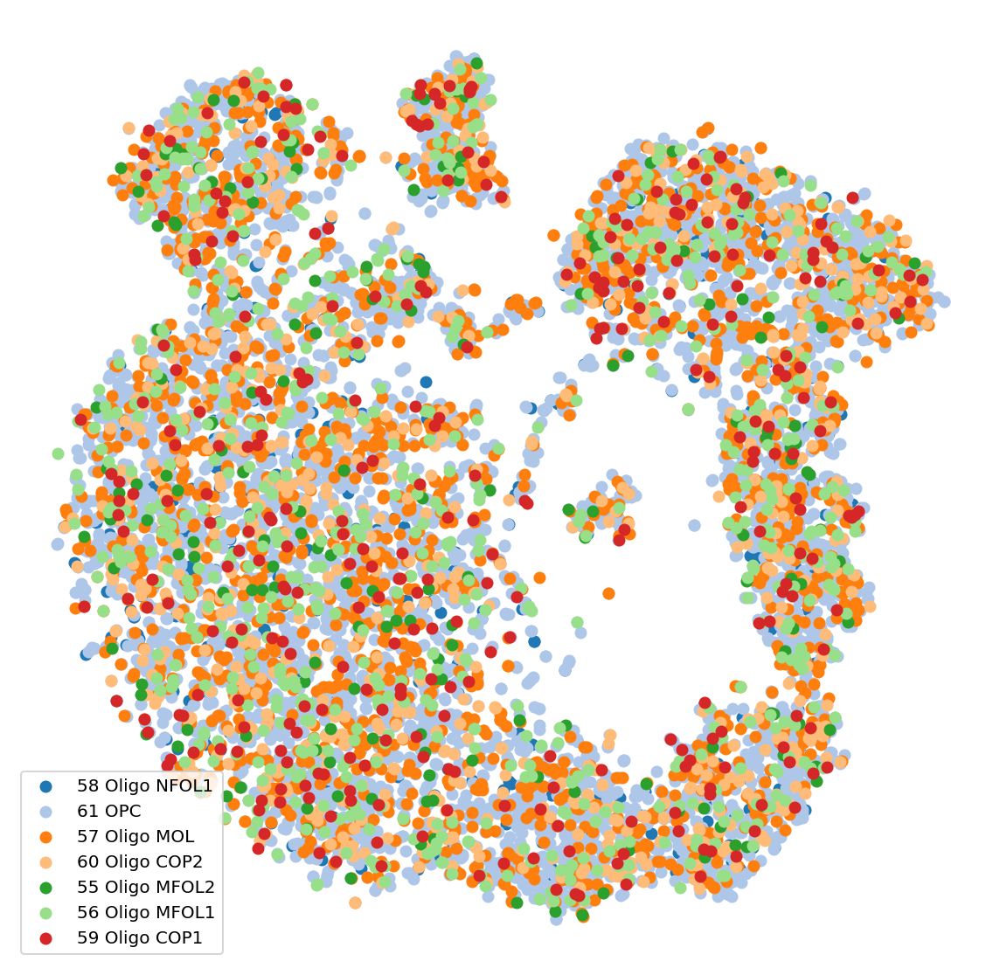

In [41]:
clusters = pd.unique(hvg_data.obs["cluster"].values)
fig, ax = plt.subplots(figsize=(10,10))
cmap = cm.get_cmap("tab20")
for i, c in (enumerate(clusters)):
    XX = hvg_data[hvg_data.obs.shuffled_label == c,:].obsm["X_nca_shuffled_tsne"]
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, label=c, color = cmap(i))
ax.set_axis_off()
plt.legend()

In [42]:
X = double.obsm["X_pca"]
y = double.obs["nca_label"].values
nca = NeighborhoodComponentsAnalysis(n_components = num_NCA, random_state = state)
double.obsm["X_nca"] = nca.fit_transform(X, y)

In [43]:
X = double.obsm["X_nca"]
tsne = TSNE(n_components = num_TSNE, metric = metric, random_state = state)
double.obsm["X_nca_tsne"] = tsne.fit_transform(X)

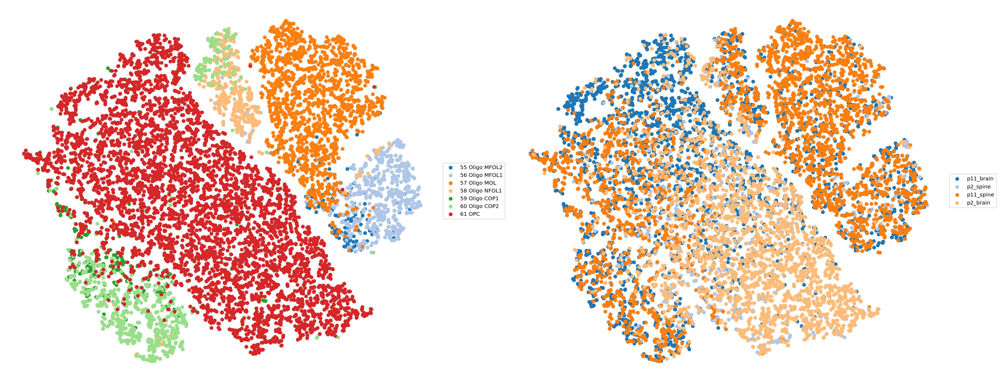

In [44]:
clusters = np.unique(double.obs["cluster"].values)
samples = pd.unique(double.obs["sample_name"].values)
fig, (ax, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize=(26,10))
cmap = cm.get_cmap("tab20")
for i, c in (enumerate(clusters)):
    XX = double[double.obs.nca_label == c,:].obsm["X_nca_tsne"]
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, label=c, color = cmap(i))
ax.set_axis_off()
ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
for i, s in (enumerate(samples)):
    XX = double[double.obs.nca_label == s, :].obsm["X_nca_tsne"]
    x = XX[:, 0]
    y = XX[:, 1]
    ax2.scatter(x, y, label = s, color = cmap(i))
ax2.set_axis_off()
ax2.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.tight_layout()

In [36]:
hvg_data.uns['iroot'] = np.flatnonzero(adata.obs['cluster']  == '61 OPC')[0]

In [37]:
sc.pp.neighbors(hvg_data, n_neighbors = n_neighbors, n_pcs = num_PCA)
sc.tl.diffmap(hvg_data)
sc.pp.neighbors(hvg_data, n_neighbors= n_neighbors, use_rep='X_diffmap')
sc.tl.dpt(hvg_data)

In [38]:
duplicate = hvg_data.copy()
duplicate.obs["nca_label"] = hvg_data.obs["dpt_pseudotime"]
pseudotime = hvg_data.concatenate(duplicate, join = 'outer')

In [39]:
unique_labels = [10*x for x in range (len(duplicate.obs.cluster))]

In [40]:
hvg_data.obs["unique_label"] = unique_labels

In [41]:
sort = np.argsort(hvg_data.obs["dpt_pseudotime"].values)

In [42]:
sorted_labels = [unique_labels[i] for i in sort]

In [43]:
hvg_data.obs["unique_label"] = [unique_labels[i] for i in sort]

In [44]:
lower_labels = hvg_data[1:, :]
upper_labels = hvg_data[:10086, :]

In [45]:
lower_labels.obs["nca_label"] = sorted_labels[1:]
upper_labels.obs["nca_label"] = sorted_labels[:10086]

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


In [46]:
pseudotime_analysis = lower_labels.concatenate(upper_labels, join = "outer")

In [47]:
labels = list(map(lambda x: int(x[:2]), hvg_data.obs.nca_label.values))

In [48]:
hvg_data.obs.nca_label = labels

In [49]:
equal_weight = hvg_data.concatenate(pseudotime_analysis, join = "outer")

In [50]:
#equal_weight = hvg_data.concatenate(equal_weight, join = "outer")

In [51]:
equal_weight

AnnData object with n_obs × n_vars = 30259 × 1999
    obs: 'sample_name', 'cluster', 'spinal_cluster', 'cell_counts', 'n_genes', 'percent_mito', 'pass_count_filter', 'pass_mito_filter', 'pseudotime_analysis', 'nca_label', 'dpt_pseudotime', 'unique_label', 'batch'
    var: 'gene_name', 'gene_counts', 'n_cells', 'pass_gene_filter', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    obsm: 'X_pca', 'X_pca_10D', 'X_pca_tsne', 'X_nca', 'X_diffmap'
    layers: 'raw', 'norm', 'log1p', 'scale'

In [123]:
X = equal_weight.obsm["X_pca"]
y = equal_weight.obs.nca_label.values
nca = NeighborhoodComponentsAnalysis(n_components = num_NCA, random_state = state)
nca.fit(X, y)

NeighborhoodComponentsAnalysis(n_components=10, random_state=42)

In [122]:
hvg_data

AnnData object with n_obs × n_vars = 10087 × 1999
    obs: 'sample_name', 'cluster', 'spinal_cluster', 'cell_counts', 'n_genes', 'percent_mito', 'pass_count_filter', 'pass_mito_filter', 'pseudotime_analysis', 'nca_label', 'dpt_pseudotime', 'unique_label', 'louvain', 'shuffled_label'
    var: 'gene_name', 'gene_counts', 'n_cells', 'pass_gene_filter', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'iroot', 'neighbors', 'diffmap_evals', 'louvain'
    obsm: 'X_pca', 'X_pca_10D', 'X_pca_tsne', 'X_nca', 'X_diffmap', 'X_nca_tsne'
    layers: 'raw', 'norm', 'log1p', 'scale'
    obsp: 'distances', 'connectivities'

In [54]:
A = hvg_data.obsm["X_pca"]
b = hvg_data.obs.nca_label.values
hvg_data.obsm["X_nca"] = nca.fit_transform(A, b)

In [124]:
A = hvg_data.obsm["X_pca"]
b = hvg_data.obs.shuffled_label.values
hvg_data.obsm["X_nca_shuffled"] = nca.fit_transform(A, b)

In [55]:
X = hvg_data.obsm["X_nca"]
tsne = TSNE(n_components = num_TSNE, metric = metric, random_state = state)
hvg_data.obsm["X_nca_tsne"] = tsne.fit_transform(X)

In [125]:
X = hvg_data.obsm["X_nca_shuffled"]
tsne = TSNE(n_components = num_TSNE, metric = metric, random_state = state)
hvg_data.obsm["X_nca_shuffled_tsne"] = tsne.fit_transform(X)

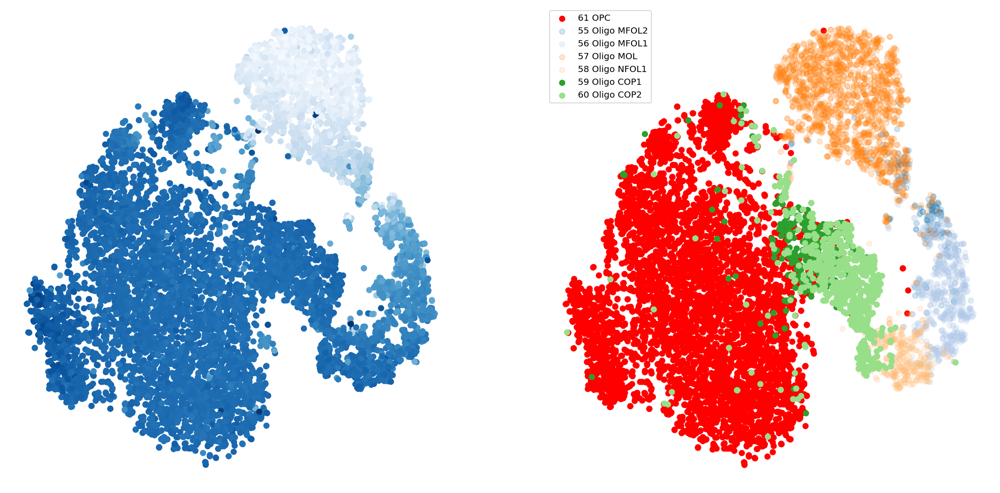

In [86]:
XX = hvg_data.obsm["X_nca_tsne"]
x = XX[:, 0]
y = XX[:, 1]
cmap = cm.get_cmap("Blues")
fig, (ax, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 10))
c = hvg_data.obs.dpt_pseudotime.values
ax.scatter(x, y, c = c, cmap = 'Blues')
ax.set_axis_off()
clusters = np.unique(hvg_data.obs.cluster)
cmap = cm.get_cmap('tab20')
XX = hvg_data[hvg_data.obs.cluster == "61 OPC", :].obsm["X_nca_tsne"]
x = XX[:, 0]
y = XX[:, 1]
ax2.scatter(x, y, color = 'r', label = "61 OPC")
for i, c in enumerate(clusters):
    if (c != "61 OPC"):
        XX = hvg_data[hvg_data.obs.cluster == c, :].obsm["X_nca_tsne"]
        x = XX[:, 0]
        y = XX[:, 1]
        if (c != "59 Oligo COP1" and c!= "60 Oligo COP2"):
            alpha = 0.2
        else:
            alpha = 1
        ax2.scatter(x, y, color = cmap(i), label = c, alpha = alpha)
ax2.set_axis_off()
ax2.legend(loc = "bottom right")

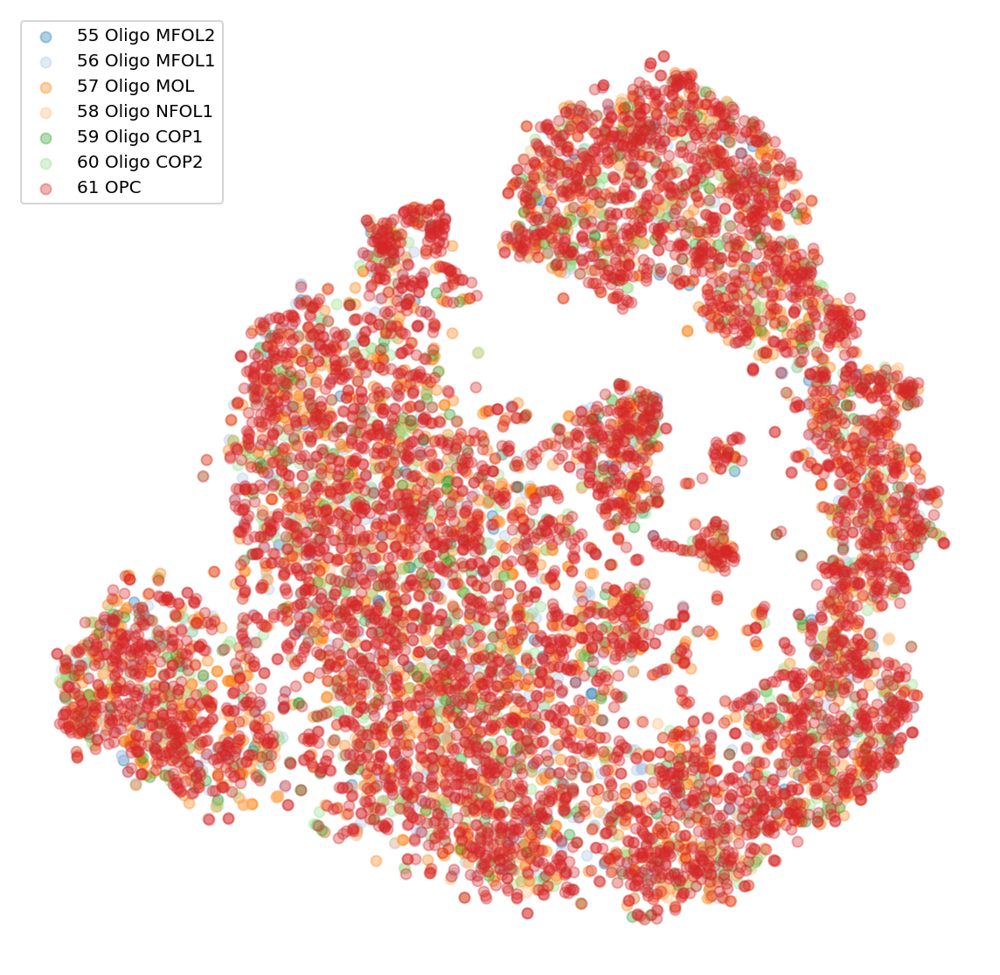

In [142]:
clusters = np.unique(hvg_data.obs.cluster)
cmap = cm.get_cmap('tab20')
fig, ax = plt.subplots(figsize = (10, 10))
for i, c in enumerate(clusters):
    XX = hvg_data[hvg_data.obs.shuffled_label == c, :].obsm["X_nca_shuffled_tsne"]
    x = XX[:, 0]
    y = XX[:, 1]
    ax.scatter(x, y, color = cmap(i), label = c, alpha = 0.35)
ax.legend()
ax.set_axis_off()

In [119]:
X = pseudotime_analysis.obsm["X_pca"]
y = pseudotime_analysis.obs.nca_label.values
nca = NeighborhoodComponentsAnalysis(n_components = num_NCA, random_state = state, init = "identity")
pseudotime_analysis.obsm["X_nca"] = nca.fit_transform(X, y)

In [133]:
X = pseudotime_analysis.obsm["X_pca"]
labels = pseudotime_analysis.obs.nca_label.values
pseudotime_analysis.obs["shuffled_label"] = shuffle(labels, random_state = state)
y = pseudotime_analysis.obs.shuffled_label.values
nca = NeighborhoodComponentsAnalysis(n_components = num_NCA, random_state = state, init = "identity")
pseudotime_analysis.obsm["X_nca_shuffled"] = nca.fit_transform(X, y)

In [134]:
X = pseudotime_analysis.obsm["X_nca_shuffled"]
tsne = TSNE(n_components = num_TSNE, metric = metric, random_state = state)
pseudotime_analysis.obsm["X_nca_shuffled_tsne"] = tsne.fit_transform(X)

In [58]:
X = pseudotime_analysis.obsm["X_nca"]
tsne = TSNE(n_components = num_TSNE, metric = metric, random_state = state)
pseudotime_analysis.obsm["X_nca_tsne"] = tsne.fit_transform(X)

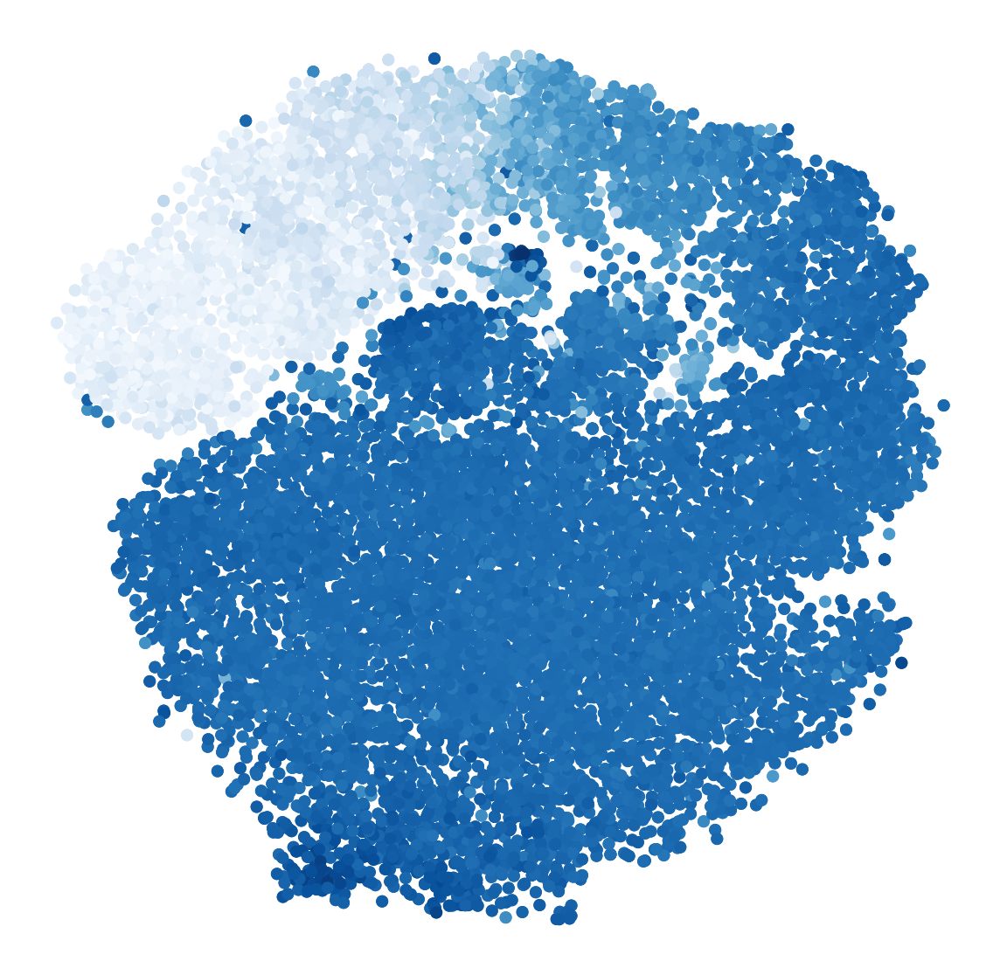

In [135]:
fig, ax = plt.subplots(figsize = (10, 10))
XX = pseudotime_analysis.obsm["X_nca_shuffled_tsne"]
x = XX[:, 0]
y = XX[:, 1]
c = pseudotime_analysis.obs.dpt_pseudotime
ax.scatter(x, y, c = c, cmap = "Blues")
ax.set_axis_off()

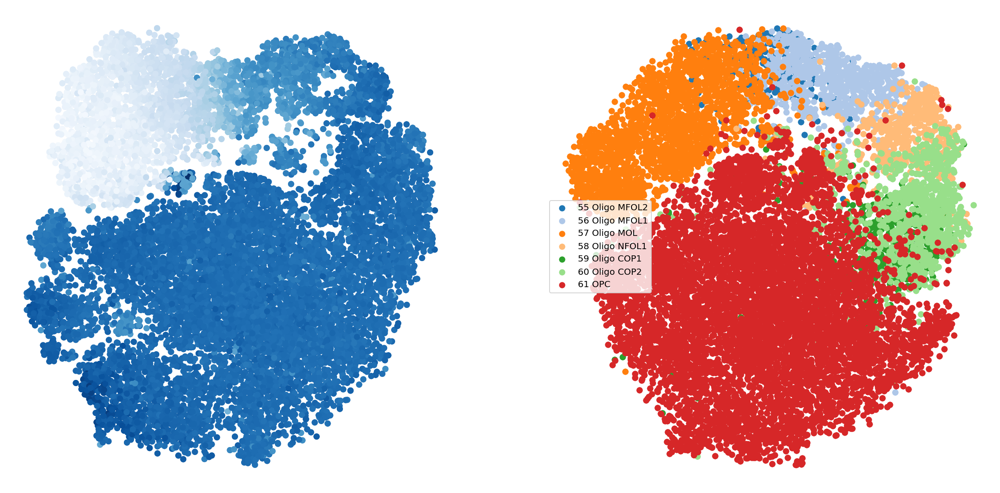

In [138]:
XX = pseudotime_analysis.obsm["X_nca_tsne"]
x = XX[:, 0]
y = XX[:, 1]
cmap = cm.get_cmap("Blues")
fig, (ax, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 10))
c = pseudotime_analysis.obs.dpt_pseudotime
ax.scatter(x, y, c = c, cmap = 'Blues')
ax.set_axis_off()
clusters = np.unique(hvg_data.obs.cluster)
cmap = cm.get_cmap('tab20')
for i, c in enumerate(clusters):
    XX = pseudotime_analysis[pseudotime_analysis.obs.cluster == c, :].obsm["X_nca_shuffled_tsne"]
    x = XX[:, 0]
    y = XX[:, 1]
    ax2.scatter(x, y, color = cmap(i), label = c)
ax2.set_axis_off()
ax2.legend(loc = "center left")

In [ ]:
clusters = np.unique(pseudotime_analysis.obs["cluster"].values)
samples = pd.unique(pseudotime_analysis.obs["sample_name"].values)
fig, (ax, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize=(20,10))
cmap = cm.get_cmap("tab20")
for i, c in (enumerate(clusters)):
    XX = pseudotime_analysis[pseudotime_analysis.obs.cluster == c,:].obsm["X_nca_tsne"]
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, label=c, color = cmap(i))
ax.set_axis_off()
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
for i, s in (enumerate(samples)):
    XX = pseudotime_analysis[pseudotime_analysis.obs.sample_name == s, :].obsm["X_nca_tsne"]
    x = XX[:, 0]
    y = XX[:, 1]
    ax2.scatter(x, y, label = s, color = cmap(i))
ax2.set_axis_off()
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()

In [88]:
copy = hvg_data.copy()

In [101]:
copy.obs["nca_label"] = hvg_data.obs.louvain.values.astype(int)
new_data = copy.concatenate(pseudotime_analysis, join = "outer")

In [102]:
new_data.obs.nca_label

18-0             17
22-0              9
129-0             5
130-0            10
132-0            15
              ...  
155967-1-1    53830
155976-1-1    79100
155988-1-1    39230
156004-1-1    67030
156009-1-1    67180
Name: nca_label, Length: 30259, dtype: int64

In [103]:
nca = NeighborhoodComponentsAnalysis(n_components = num_NCA, random_state = state, init = "identity")

In [130]:
X = new_data.obsm["X_pca"]
y = new_data.obs.nca_label.values
nca.fit(X, y)
A = copy.obsm["X_pca"]
labels = copy.obs.louvain.values
copy.obs["shuffled_labels"] = shuffle(labels, random_state = state)
b = copy.obs.shuffled_labels.values
copy.obsm["X_nca"] = nca.fit_transform(A, b)

In [131]:
# t-SNE the NCA projection
X = copy.obsm["X_nca"]
tsne = TSNE(n_components=num_TSNE, metric=metric, random_state=state)
copy.obsm["X_nca_shuffled_tsne"] = tsne.fit_transform(X)

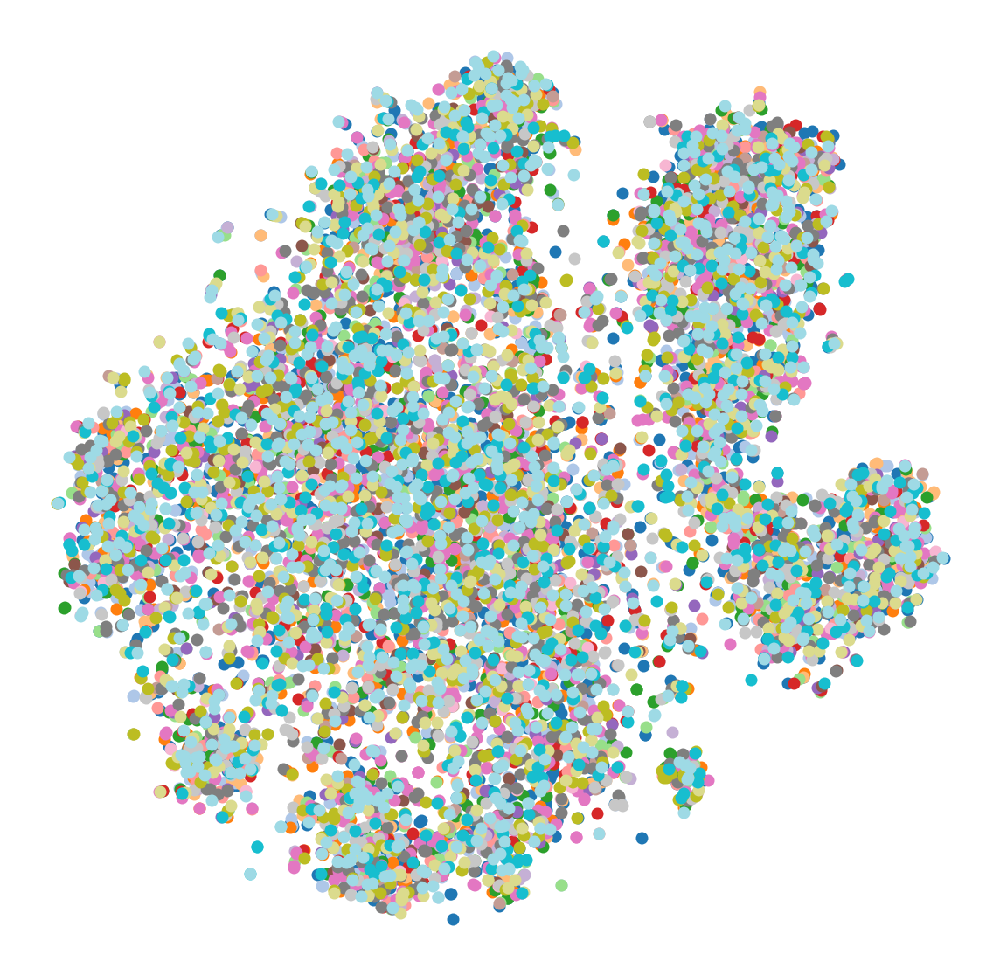

In [132]:
clusters = np.unique(copy.obs.louvain.values)
fig, ax = plt.subplots(figsize = (10, 10))
cmap = cm.get_cmap("tab20")
for i, c in enumerate(clusters):
    XX = copy[copy.obs.shuffled_labels == c, :].obsm["X_nca_shuffled_tsne"]
    x = XX[:, 0]
    y = XX[:, 1]
    ax.scatter(x, y, label = c, color = cmap(i))
ax.set_axis_off()

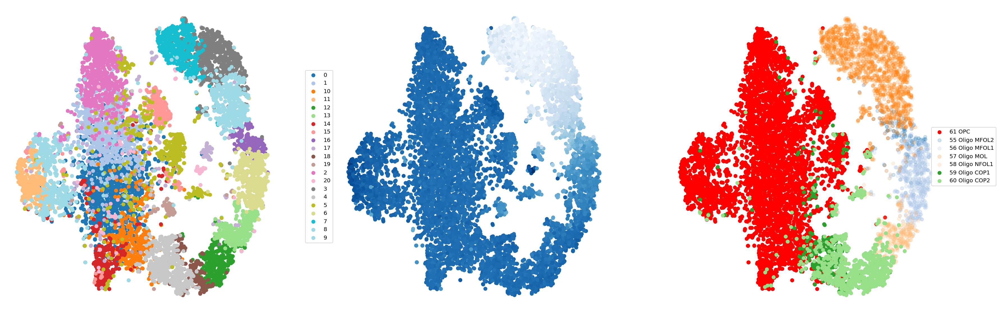

In [118]:
clusters = np.unique(copy.obs.louvain.values)
fig, (ax, ax2, ax3) = plt.subplots(nrows = 1, ncols = 3, figsize=(30,10))
cmap = cm.get_cmap("tab20")
for i, c in (enumerate(clusters)):
    XX = copy[copy.obs.louvain == c,:].obsm["X_nca_tsne"]
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, label=c, color = cmap(i))
ax.set_axis_off()
ax.legend(loc = "center right", bbox_to_anchor=(1.2, 0.5))
XX = copy.obsm["X_nca_tsne"]
x = XX[:, 0]
y = XX[:, 1]
c = copy.obs.dpt_pseudotime
ax2.scatter(x, y, c = c, cmap = "Blues")
ax2.set_axis_off()
clusters = np.unique(copy.obs.cluster.values)
XX = copy[copy.obs.cluster == "61 OPC", :].obsm["X_nca_tsne"]
x = XX[:, 0]
y = XX[:, 1]
ax3.scatter(x, y, color = 'r', label = "61 OPC")
for i, c in enumerate(clusters):
    if (c != "61 OPC"):
        XX = copy[copy.obs.cluster == c, :].obsm["X_nca_tsne"]
        x = XX[:, 0]
        y = XX[:, 1]
        if (c != "59 Oligo COP1" and c!= "60 Oligo COP2"):
            alpha = 0.2
        else:
            alpha = 1
        ax3.scatter(x, y, color = cmap(i), label = c, alpha = alpha)
ax3.set_axis_off()
ax3.legend(loc = "center right", bbox_to_anchor=(1.2, 0.5))

In [ ]:
full_data = hvg_data.concatenate(pseudotime_analysis, join = "outer")

In [ ]:
full_data

In [ ]:
nca = NeighborhoodComponentsAnalysis(n_components = num_NCA, random_state = state)
X = full_data.obsm["X_pca"]
y = full_data.obs.nca_label.values
nca.fit(X, y)
A = hvg_data.obsm["X_pca"]
b = hvg_data.obs.nca_label.values
hvg_data.obsm["X_nca"] = nca.fit_transform(A, b)
X = hvg_data.obsm["X_nca"]
tsne = TSNE(n_components=num_TSNE, metric=metric, random_state=state)
hvg_data.obsm["X_nca_tsne"] = tsne.fit_transform(X)

In [ ]:
clusters = np.unique(hvg_data.obs["cluster"].values)
fig, ax = plt.subplots(figsize=(10,10))
cmap = cm.get_cmap("tab20")
for i, c in (enumerate(clusters)):
    XX = hvg_data[hvg_data.obs.cluster == c,:].obsm["X_nca_tsne"]
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, label=c, color = cmap(i))
ax.set_axis_off()
plt.legend()

In [ ]:
sc.pp.neighbors(hvg_data)

In [62]:
sc.tl.louvain(hvg_data)

In [63]:
hvg_data

AnnData object with n_obs × n_vars = 10087 × 1999
    obs: 'sample_name', 'cluster', 'spinal_cluster', 'cell_counts', 'n_genes', 'percent_mito', 'pass_count_filter', 'pass_mito_filter', 'pseudotime_analysis', 'nca_label', 'dpt_pseudotime', 'unique_label', 'louvain'
    var: 'gene_name', 'gene_counts', 'n_cells', 'pass_gene_filter', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'iroot', 'neighbors', 'diffmap_evals', 'louvain'
    obsm: 'X_pca', 'X_pca_10D', 'X_pca_tsne', 'X_nca', 'X_diffmap', 'X_nca_tsne'
    layers: 'raw', 'norm', 'log1p', 'scale'
    obsp: 'distances', 'connectivities'

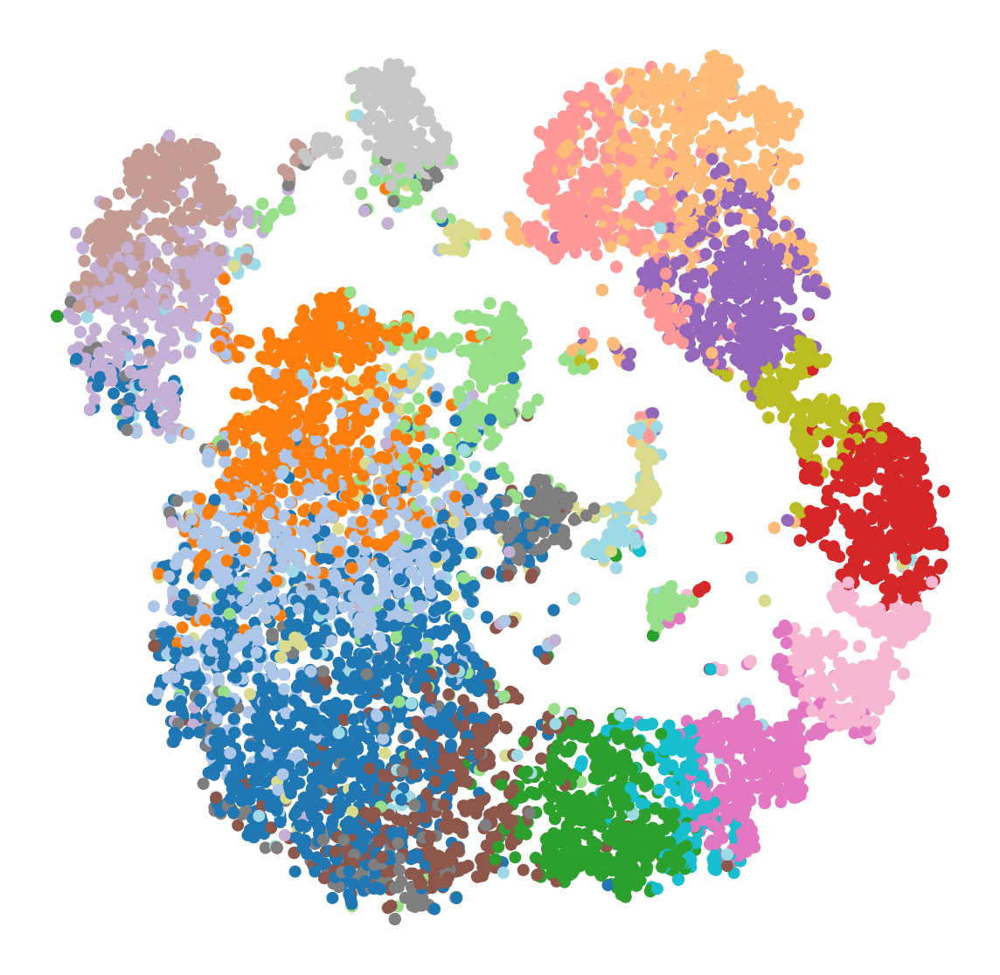

In [64]:
fig, ax = plt.subplots(figsize = (10, 10))
XX = hvg_data.obsm["X_pca_tsne"]
x = XX[:, 0]
y = XX[:, 1]
cmap = cm.get_cmap("tab20")
c = hvg_data.obs.louvain.values.astype(int)
ax.scatter(x, y, c = c, cmap = "tab20")
ax.set_axis_off()

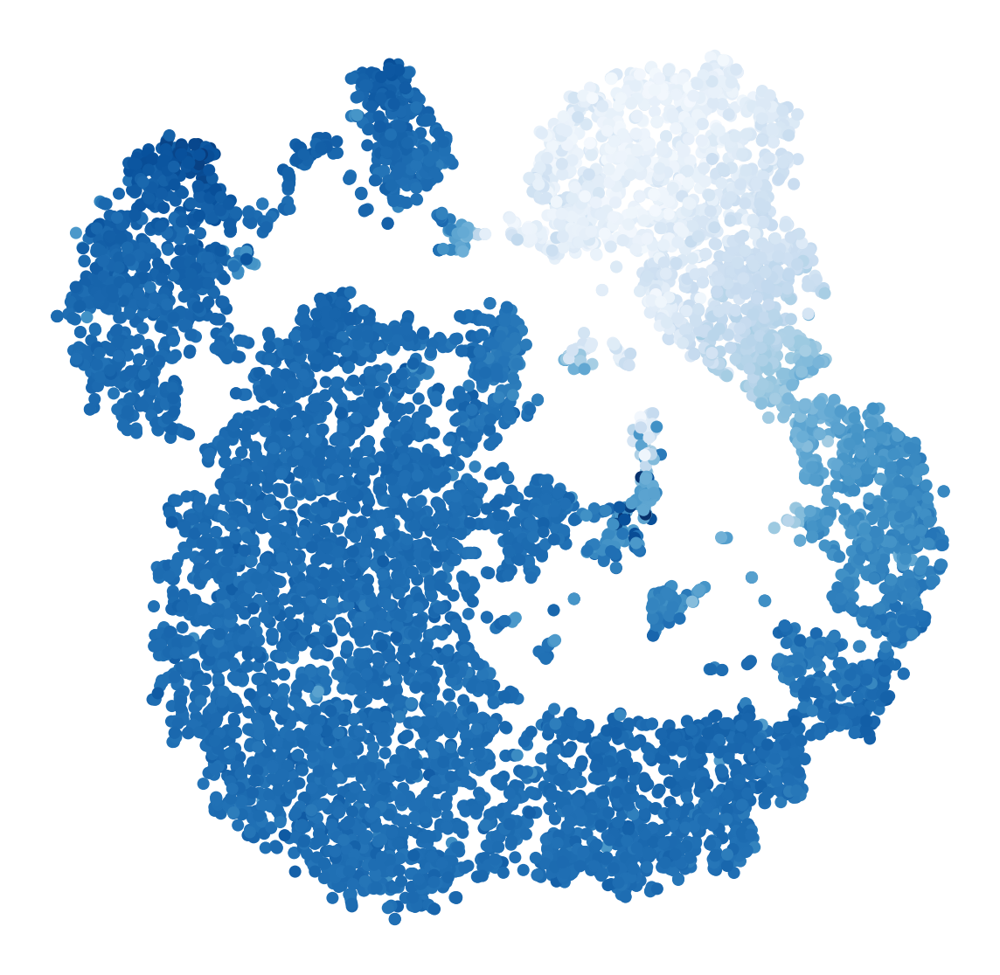

In [120]:
fig, ax = plt.subplots(figsize = (10, 10))
XX = hvg_data.obsm["X_pca_tsne"]
x = XX[:, 0]
y = XX[:, 1]
cmap = cm.get_cmap("tab20")
c = hvg_data.obs.dpt_pseudotime.values.astype(float)
ax.scatter(x, y, c = c, cmap = "Blues")
ax.set_axis_off()

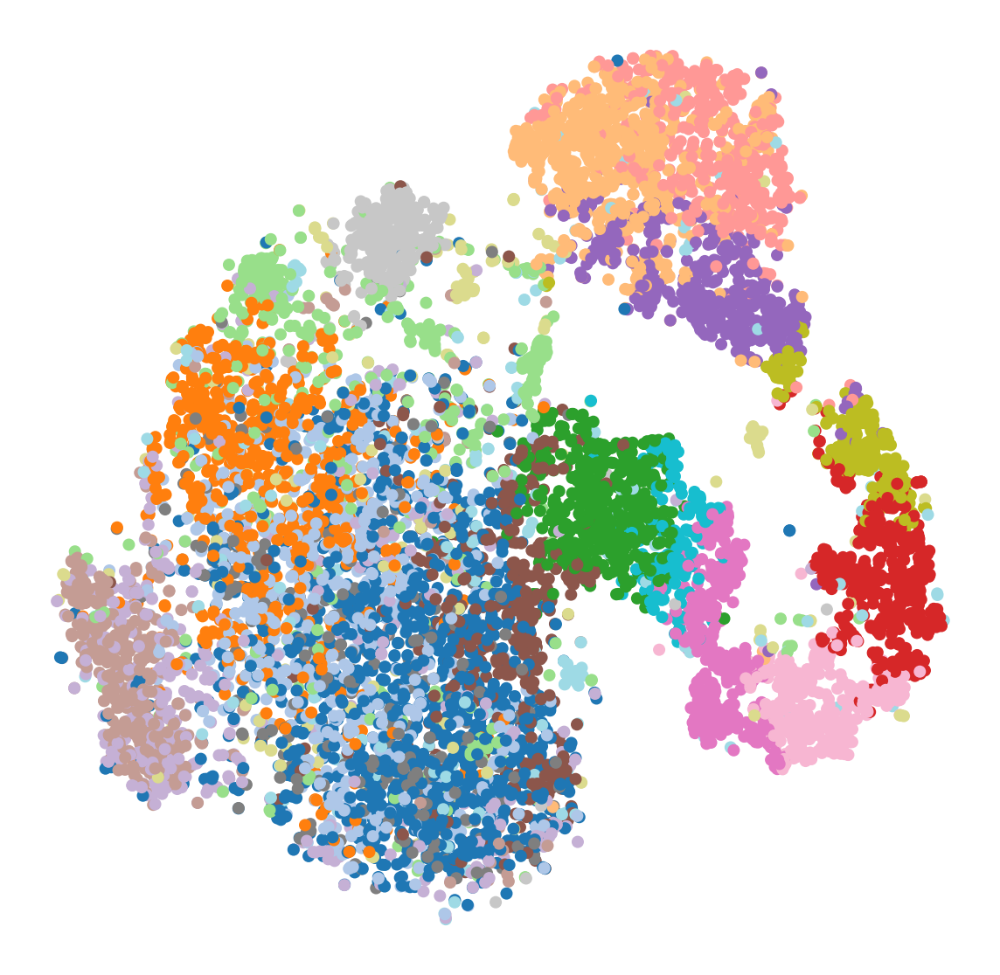

In [65]:
fig, ax = plt.subplots(figsize = (10, 10))
XX = hvg_data.obsm["X_nca_tsne"]
x = XX[:, 0]
y = XX[:, 1]
cmap = cm.get_cmap("tab20")
c = hvg_data.obs.louvain.values.astype(int)
ax.scatter(x, y, c = c, cmap = "tab20")
ax.set_axis_off()